In [19]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload



 ⏹ The color of the plane is snow

 ⏹ Working on axis shaped (48, 48)

 ⏹ Input array shaped (48, 48, 48)

 ⏹ ----------------------------

 ⏹ Output array shaped (48, 48, 48)

 ⏹ ----------------------------

 🔽 Plotting [26-02-2023-23-18-50]


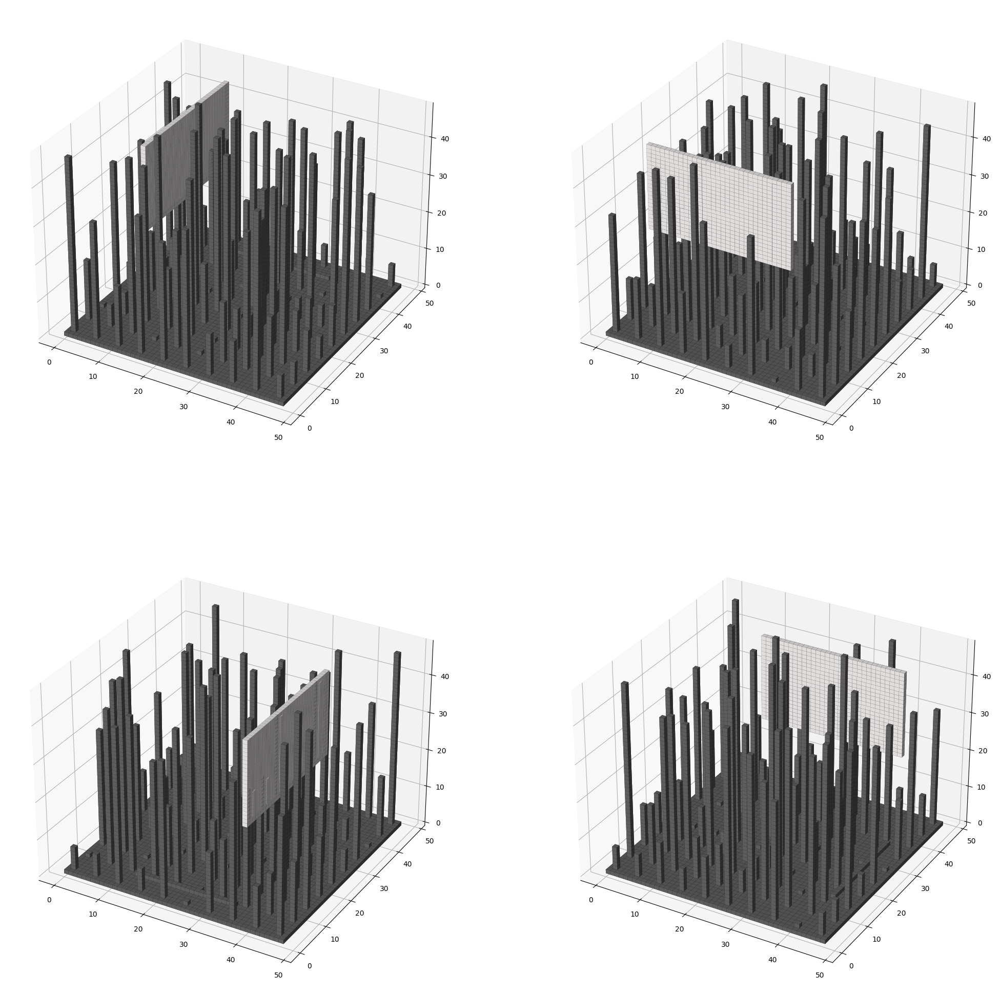

In [20]:
from deepSculpt.sculptor.components.grid_components import attach_grid
from deepSculpt.sculptor.components.plane_components import attach_plane
from deepSculpt.sculptor.components.edge_components import attach_edge
from deepSculpt.manager.tools.plotter import Plotter

import numpy as np
import os

void_dim = 48

volumes_void = np.zeros((void_dim, void_dim, void_dim))

materials_void = np.empty(volumes_void.shape, dtype=object)

separacion = 4

volumes_void, materials_void = attach_grid(volumes_void=volumes_void, materials_void=materials_void, step=separacion, verbose=False)

volumes_void, materials_void = attach_plane(volumes_void,
                                             materials_void,
                                             0.1,
                                             0.9,
                                             3,
                                             verbose=True)

volumes_void, materials_void = attach_edge(volumes_void,
                                        materials_void,
                                        0.1,
                                        0.9,
                                        3,
                                        verbose=True)

plot = Plotter(volumes=volumes_void, colors=materials_void)

out_dir = os.path.join(
                    os.environ.get("HOME"),
                    "code",
                    "juan-garassino",
                    "deepSculpt", "results"
                )

plot.plot_sculpture(out_dir)

In [21]:
from deepSculpt.manager.tools.params import COLORS
from deepSculpt.sculptor.sculptor import Sculptor
from deepSculpt.manager.tools.plotter import Plotter

import os

sculptor = Sculptor(
    void_dim=32,
    edges=(30, 0.9, 0.95),  # number of elements, minimun, maximun
    planes=(5, 0.4, 0.5),
    volumes=(3, 0.3, 0.9),
    grid=(1, 4),  # minimun height of column, and maximun height
    materials_edges=COLORS['edges'],
    materials_planes=COLORS['planes'],
    materials_volumes=COLORS['volumes'],
    step=6,
)

volumes, materials = sculptor.generative_sculpt()

plot = Plotter(volumes=volumes, colors=materials)

out_dir = os.path.join(
                    os.environ.get("HOME"),
                    "code",
                    "juan-garassino",
                    "deepSculpt", 'results'
                )

# plot.plot_sculpture(out_dir)

In [22]:
import numpy as np

def increase_resolution(arr, N):
    n_x, n_y, n_z = arr.shape
    new_arr = np.zeros((N * n_x, N * n_y, N * n_z, 3))
    for i in range(n_x):
        for j in range(n_y):
            for k in range(n_z):
                if arr[i, j, k]:
                    x = np.linspace(i, i + 1, N + 1)[:-1]
                    y = np.linspace(j, j + 1, N + 1)[:-1]
                    z = np.linspace(k, k + 1, N + 1)[:-1]
                    xv, yv, zv = np.meshgrid(x, y, z, indexing='ij')
                    vertices = np.stack((xv, yv, zv), axis=-1)
                    vertices = vertices.reshape(-1, 3)
                    new_arr[N * i:N * (i + 1), N * j:N * (j + 1),
                            N * k:N * (k + 1)] = vertices.reshape(N, N, N, 3)
    return np.unique(new_arr.reshape(-1, 3), axis=0)


new_array = increase_resolution(volumes_void, 3)

new_array.shape

(144261, 3)

In [23]:
import plotly.graph_objects as go
import numpy as np


def plot_points_3d(x, y, z, size=1.0, color=(0, 0, 0), alpha=1.0):
    # Create the scatter3d trace
    trace = go.Scatter3d(
        x=x,
        y=y,
        z=z,
        mode='markers',
        marker=dict(
            size=size,
            color=f'rgba({color[0]}, {color[1]}, {color[2]}, {alpha})'))

    # Set the layout of the plot
    layout = go.Layout(scene=dict(aspectratio=dict(x=1, y=1, z=1),
                                  xaxis=dict(title='X'),
                                  yaxis=dict(title='Y'),
                                  zaxis=dict(title='Z')))

    # Plot the trace
    fig = go.Figure(data=trace, layout=layout)
    fig.show()


In [24]:
plot_points_3d(new_array[:, 0], new_array[:, 1], new_array[:, 2])

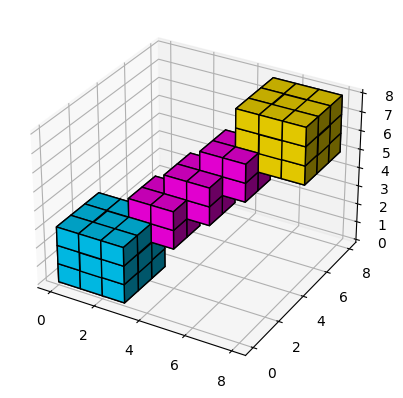

In [61]:
import matplotlib.pyplot as plt
import numpy as np

# prepare some coordinates
x, y, z = np.indices((8, 8, 8))

# draw cuboids in the top left and bottom right corners, and a link between
# them
cube1 = (x < 3) & (y < 3) & (z < 3)
cube2 = (x >= 5) & (y >= 5) & (z >= 5)
link = abs(x - y) + abs(y - z) + abs(z - x) <= 2

# combine the objects into a single boolean array
voxelarray = cube1 | cube2 | link

# set the colors of each object
colors = np.zeros(voxelarray.shape + (3, ), dtype=int)
colors[np.nonzero(link)] = (255, 0, 234)
colors[np.nonzero(cube1)] = (0, 207, 255)
colors[np.nonzero(cube2)] = (255, 225, 0)

# and plot everything
ax = plt.figure().add_subplot(projection='3d')
ax.voxels(voxelarray, facecolors=colors / 255.0, edgecolor='k')

plt.show()


In [56]:
colors.shape

(8, 8, 8, 3)